In [1]:
import tensorflow

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pickle

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from sklearn.model_selection import train_test_split
import os
import random
from PIL import Image
import shutil
import cv2

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', 500)

In [3]:
os.getcwd()

'/Users/anarpereira/Docs_tcc/TCC'

In [4]:
diretorio_base= '/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/'

In [5]:
files = []
folders = []

df = pd.DataFrame(columns=['qty_files', 'folder', 'file_paths'])  # Cria um DataFrame vazio com as colunas desejadas

for pasta in os.listdir(diretorio_base):
    if 'PRE_PROCESSING' in pasta and '.' not in pasta:
        folders.append(pasta)
        caminho_pasta = os.path.join(diretorio_base, pasta)
        if os.path.isdir(caminho_pasta):
            # Obtém os arquivos da pasta
            arquivos = os.listdir(caminho_pasta)
            
            files_path = [os.path.join(pasta, arquivo) for arquivo in arquivos if '.ipy' not in arquivo]
    
            # Cria um DataFrame temporário com as informações da iteração atual
            temp_df = pd.DataFrame({'qty_files': len(files_path), 'folder': pasta, 'file_paths': [files_path]}, index=[0])
            
            if (len(files_path)!=0):
                # Concatena o DataFrame temporário com o DataFrame principal
                df = pd.concat([df, temp_df], ignore_index=True)
                files.extend(files_path)

In [6]:
df.shape

(5, 3)

In [7]:
df = df.sort_values(by='qty_files', ascending=False)[:5]

In [8]:
df[['qty_files','folder']]

,qty_files,folder
0,358,Marasmiusamazonicus_PRE_PROCESSING
2,325,Phallusindusiatuscomplex_PRE_PROCESSING
1,265,Cookeinatricholoma_PRE_PROCESSING
4,198,Coprinellusdisseminatus_PRE_PROCESSING
3,195,Schizophyllumcommune_PRE_PROCESSING


In [9]:
df[['qty_files','folder']]

,qty_files,folder
0,358,Marasmiusamazonicus_PRE_PROCESSING
2,325,Phallusindusiatuscomplex_PRE_PROCESSING
1,265,Cookeinatricholoma_PRE_PROCESSING
4,198,Coprinellusdisseminatus_PRE_PROCESSING
3,195,Schizophyllumcommune_PRE_PROCESSING


In [10]:
folders = df['folder'].to_list()

In [11]:
dict_names = {"Marasmiusamazonicus_PRE_PROCESSING":'Marasmius Amazonicus',
"Phallusindusiatuscomplex_PRE_PROCESSING":'Phallus indusiatus',
"Schizophyllumcommune_PRE_PROCESSING":'Schizophyllum commune',
"Coprinellusdisseminatus_PRE_PROCESSING":'Coprinellus Disseminatus',
"Cookeinatricholoma_PRE_PROCESSING":'Cookeina tricholoma'}

In [12]:
dict_codes = {"Marasmiusamazonicus_PRE_PROCESSING":1,
"Phallusindusiatuscomplex_PRE_PROCESSING":2,
"Schizophyllumcommune_PRE_PROCESSING":3,
"Coprinellusdisseminatus_PRE_PROCESSING":4,
"Cookeinatricholoma_PRE_PROCESSING":5}

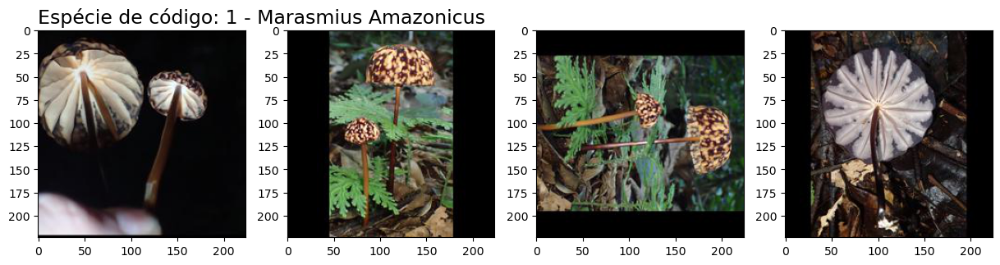

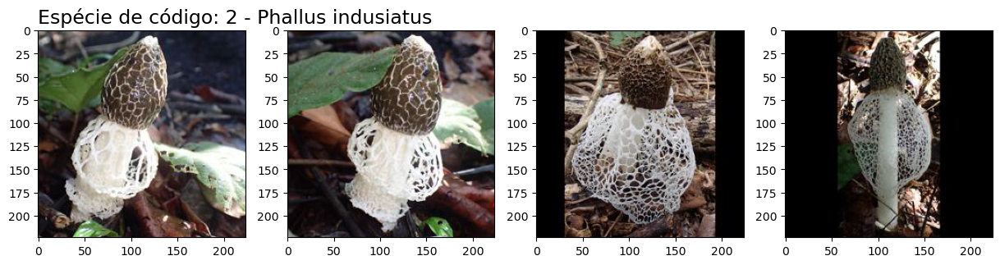

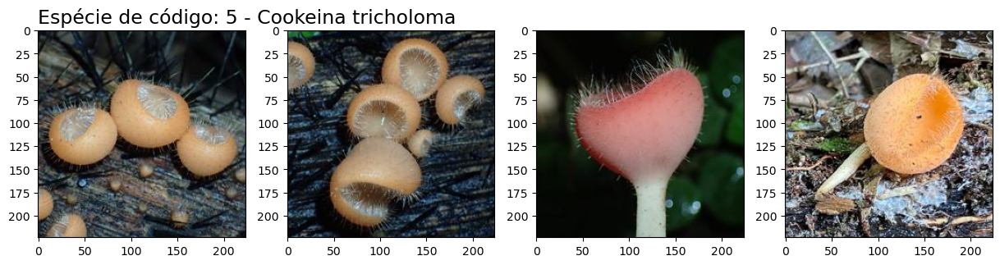

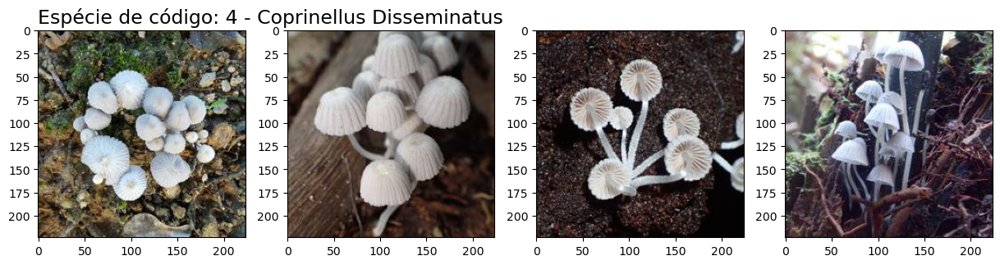

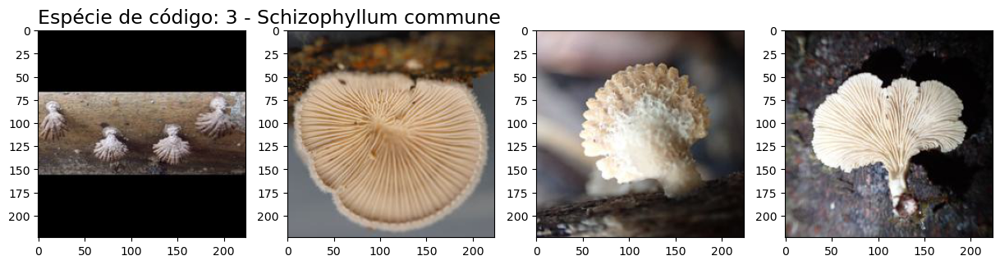

In [13]:
num_images_per_class = 4

for row_idx, (folder, file_paths) in enumerate(zip(df['folder'], df['file_paths'])):
    count = 0
    fig, axes = plt.subplots(nrows=1, ncols=num_images_per_class, figsize=(15, 10))
    axes[0].set_title(f'Espécie de código: {dict_codes[folder]} - {dict_names[folder]}', 
                      size=17,
                     loc='left')
    random.shuffle(file_paths)

    for col_idx, file_path in enumerate(file_paths):
        if count < num_images_per_class:
            img_path = os.path.join(diretorio_base, file_path)
            imagem = mpimg.imread(img_path)
            axes[col_idx].imshow(imagem)
            count += 1

# Set the class label as the title for the first image in the row
    # plt.tight_layout()
    plt.show()

In [14]:
train_folder = os.path.join(diretorio_base, 'train')

for files_species in df['file_paths']:
    
    # determine the number of images for each set
    train_size = int(len(files_species) * 1.00)
    
    # Create destination folders if they don't exist
    for folder_path in [train_folder]:
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
            
    # Copy image files to destination folders
    for i, f in enumerate(files_species):
        if i < train_size:
            dest_folder = train_folder
        
        for folder in folders:
            if not os.path.exists(os.path.join(dest_folder, folder)):
                os.makedirs(os.path.join(dest_folder, folder))
    
        shutil.copyfile(src=os.path.join(diretorio_base, f), dst=os.path.join(dest_folder, f))

def get_data(folder_division):
    df = pd.DataFrame(columns=['species','file_path','folder','folder_division'])

    for files in os.listdir(folder_division):
        print(files)
        if '.' not in files and '.DS_Store' not in files:
            species = files.split('_')[0].lower()
            new_file_list = []
            
            for i in os.listdir(os.path.join(folder_division, files)):
                if '.DS_Store' not in i and '_PRE_PROCESSING' not in i:
                    new_file_list.append(i)
                else:
                    print(i)
                    
            qty_files = len(new_file_list)
            
            df_temp = pd.DataFrame(data={'species':[species]*qty_files,
                                         'file_path':new_file_list,
                                         'folder':[files]*qty_files,
                                         'folder_division':[folder_division]*qty_files},
                                   columns=['species','file_path','folder','folder_division'])

            df = pd.concat([df, df_temp])
    return df.reset_index()

df_train = get_data(train_folder)
df_train['full_path'] = df_train['folder_division'] + '/' + df_train['folder'] + '/' + df_train['file_path']

Marasmiusamazonicus_PRE_PROCESSING
Cookeinatricholoma_PRE_PROCESSING
Phallusindusiatuscomplex_PRE_PROCESSING
.DS_Store
imagens_tratadas
Marasmiusamazonicus_PRE_PROCESSING
Cookeinatricholoma_PRE_PROCESSING
Phallusindusiatuscomplex_PRE_PROCESSING
.DS_Store
Schizophyllumcommune_PRE_PROCESSING
Coprinellusdisseminatus_PRE_PROCESSING
Schizophyllumcommune_PRE_PROCESSING
.DS_Store
Coprinellusdisseminatus_PRE_PROCESSING


# Tratamento de imagem

## Removendo backgrouds

### grabCut Algorithm

O algoritmo GrabCut é uma técnica poderosa e interativa para a segmentação de imagens, que é particularmente eficaz para separar objetos de interesse do fundo em uma imagem. Ele é baseado em um modelo de gráficos (graph cuts) e combina características de cor e informações de contorno para realizar a segmentação.

Conceito Básico
O GrabCut é usado para separar o primeiro plano (o objeto de interesse) do fundo em uma imagem. A segmentação é feita iterativamente, e o usuário pode refinar o resultado interativamente. O algoritmo utiliza modelos de mistura gaussiana (GMM) para modelar as distribuições de cor do primeiro plano e do fundo.

Funcionamento do Algoritmo GrabCut
Entrada Inicial (Seleção do Retângulo):

O algoritmo começa com uma entrada inicial do usuário, que desenha um retângulo ao redor do objeto de interesse. Esse retângulo indica ao algoritmo que tudo dentro dele é provavelmente o primeiro plano (o objeto) e tudo fora é definitivamente o fundo.
Os pixels dentro do retângulo são inicialmente classificados como "provavelmente primeiro plano" ou "provavelmente fundo", enquanto os pixels fora do retângulo são classificados como "definitivamente fundo".

Modelos de Mistura Gaussiana (GMM):

O algoritmo utiliza dois modelos GMM para modelar a distribuição de cor do primeiro plano e do fundo. Os GMMs são ajustados com base nos pixels classificados como "provavelmente primeiro plano" e "provavelmente fundo".
Cada pixel é avaliado para determinar a qual das distribuições ele pertence (primeiro plano ou fundo), com base na cor.
Construção do Grafo:

O GrabCut constrói um grafo onde cada pixel é representado como um nó. As bordas entre os nós têm um peso que representa a "similaridade" entre os pixels conectados, considerando tanto a cor quanto a proximidade.
O algoritmo usa a técnica de min-cut/max-flow para cortar o grafo, separando os pixels que pertencem ao primeiro plano daqueles que pertencem ao fundo.


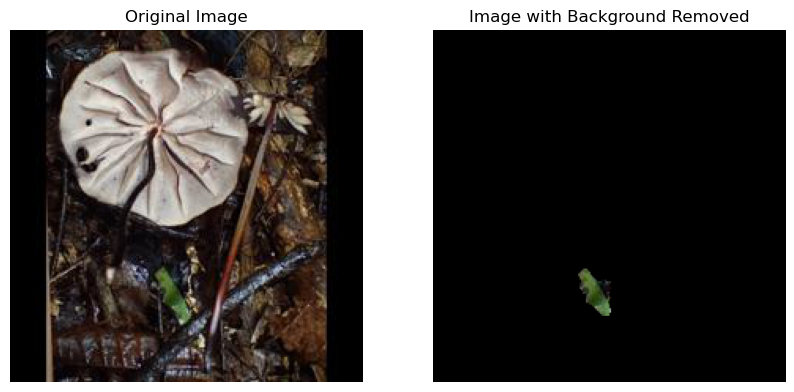

In [15]:
# Load the image
image = cv2.imread(df_train['full_path'][1])

# Create a mask
mask = np.zeros(image.shape[:2], np.uint8)

# Create temporary arrays used by the algorithm
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

# Define the rectangle (x, y, width, height) around the object
rect = (50, 
       70, image.shape[1] - 112, image.shape[0] - 112)

# Apply GrabCut algorithm
cv2.grabCut(image, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

# Modify the mask to remove the background
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
result = image * mask2[:, :, np.newaxis]

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Image with Background Removed')
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()


### Color-Based Segmentation

A segmentação baseada em cor (Color-Based Segmentation) é uma técnica de processamento de imagens usada para identificar e separar objetos em uma imagem com base nas cores dos pixels. Essa abordagem é particularmente útil em imagens onde a cor é um atributo distintivo dos objetos que você deseja segmentar, como frutas em uma árvore, carros em uma estrada, ou áreas específicas em imagens médicas.

Conceito Básico
A ideia central da segmentação baseada em cor é dividir uma imagem em diferentes regiões, onde cada região contém pixels com características de cor semelhantes. Em outras palavras, o objetivo é agrupar pixels que têm cores próximas para formar objetos ou áreas significativas na imagem.

Explanation of the Bounds:

Lower Bound (lower_bound = np.array([40, 40, 40])): This specifies the minimum hue, saturation, and value that will be considered as part of the green color.
Upper Bound (upper_bound = np.array([80, 255, 255])): This specifies the maximum hue, saturation, and value that will be considered as part of the green color.
In this example:

Hue (40 to 80): Covers a range of green hues.
Saturation (40 to 255): Ensures that both less saturated (dull) and fully saturated (vibrant) greens are included.

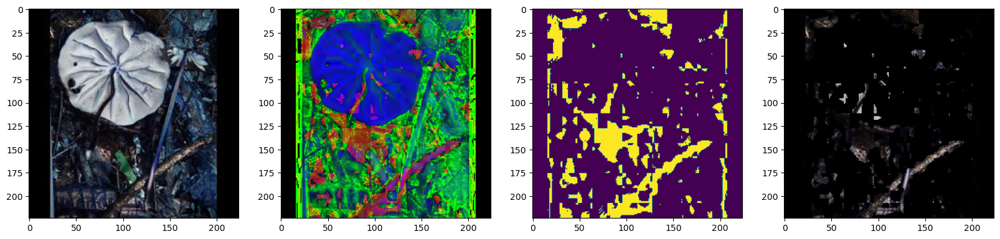

In [16]:
image = cv2.imread(df_train['full_path'][1])
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define color range for the background
lower_bound = np.array([0, 0, 0])  # Adjust based on the background color
upper_bound = np.array([80, 255, 255])

# Create a mask for the background
mask = cv2.inRange(hsv, lower_bound, upper_bound)

# Invert the mask to get the foreground
foreground_mask = cv2.bitwise_not(mask)

# Use the mask to extract the foreground
foreground = cv2.bitwise_and(image, image, mask=foreground_mask)

fig, axs=plt.subplots(1,4, figsize=(20,20))

axs[0].imshow(image)
axs[1].imshow(hsv)
axs[2].imshow(foreground_mask)
axs[3].imshow(foreground)


### Watershed

O método Watershed é uma técnica de segmentação de imagens muito usada em processamento de imagens para separar ou delimitar objetos em uma imagem, especialmente quando esses objetos estão tocando ou sobrepostos.

Conceito Básico
Pense em uma imagem em escala de cinza como se fosse uma paisagem montanhosa, onde a intensidade dos pixels representa a "altitude" das montanhas. Nessa analogia, os pontos mais claros seriam picos altos, e os pontos mais escuros seriam vales profundos.

O objetivo do método Watershed é "inundar" essa paisagem com água, começando pelos pontos mais baixos, até que as diferentes regiões, ou "bacias hidrográficas", se encontrem. O ponto onde duas bacias se encontram forma uma borda ou "crista", que será a linha de separação entre diferentes objetos ou regiões na imagem.


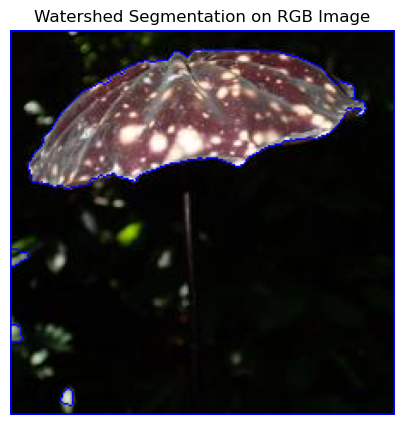

In [23]:
image = cv2.imread(df_train['full_path'][10])
# Convert the image to grayscale for Watershed processing
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply a binary threshold to get a binary image
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Remove noise using morphological operations
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)

# Dilate the image to get the sure background area
sure_bg = cv2.dilate(opening, kernel, iterations=3)

# Use distance transform to find sure foreground area
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

# Find the unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

# Marker labeling
_, markers = cv2.connectedComponents(sure_fg)

# Add one to all labels so that the sure background is not 0, but 1
markers = markers + 1

# Mark the region of unknown with zero
markers[unknown == 255] = 0

# Apply the Watershed algorithm
markers = cv2.watershed(image, markers)

# Mark the boundaries on the original image
image[markers == -1] = [255, 0, 0]  # Boundaries in red

# Display the result
plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Watershed Segmentation on RGB Image')
plt.axis('off')
plt.show()


### Lib rembg

In [24]:
from rembg import remove
def remove_bg(image):
    image = cv2.imread(img_path)
    return remove(image, bgcolor=(0,0,0,255))

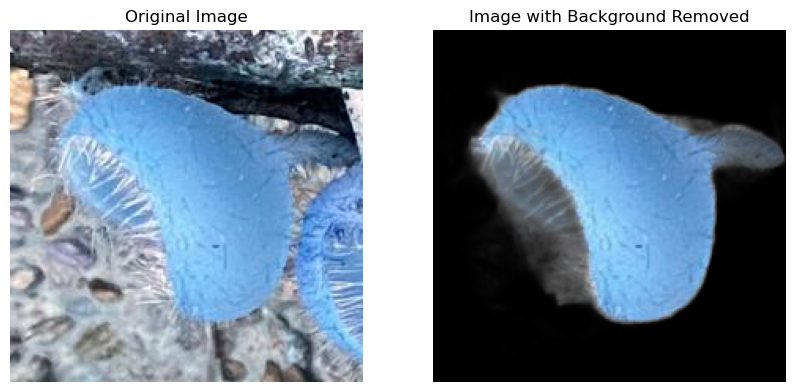

In [25]:

image = cv2.imread(df_train['full_path'][600])

output_path = 'output.png'
output = remove(image, bgcolor=(0,0,0,255))

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Image with Background Removed')
plt.imshow(output)
plt.axis('off')

plt.show()

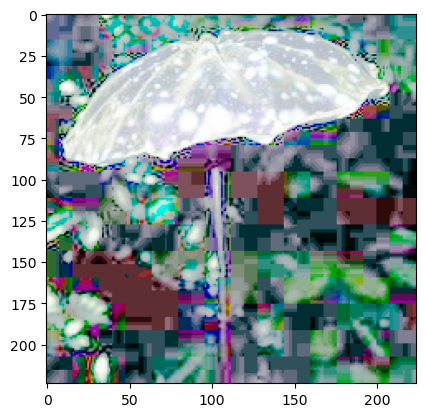

In [48]:
plt.imshow(eq_img)


In [63]:
df_train['species'].value_counts()

species
marasmiusamazonicus         358
phallusindusiatuscomplex    325
cookeinatricholoma          265
coprinellusdisseminatus     198
schizophyllumcommune        194
Name: count, dtype: int64

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


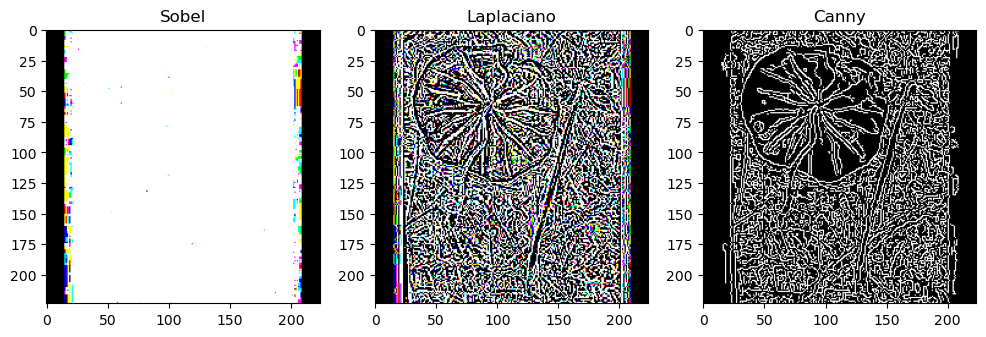

In [81]:
img_path = df_train[df_train['species']=='marasmiusamazonicus']['full_path'].iloc[1]

# img_path = df_train['full_path'][534]
image = cv2.imread(img_path)
normalized_image = image / 255.0

R, G, B = cv2.split(image)
output1_R = cv2.equalizeHist(R)
output1_G = cv2.equalizeHist(G)
output1_B = cv2.equalizeHist(B)

eq_img = cv2.merge((output1_R, output1_G, output1_B))

# Filtro Sobel (Detecção de bordas)
sobelx = cv2.Sobel(eq_img, cv2.CV_64F, 1, 0, ksize=3)  # Derivada X
sobely = cv2.Sobel(eq_img, cv2.CV_64F, 0, 1, ksize=3)  # Derivada Y
sobel_combined = cv2.magnitude(sobelx, sobely)

# Filtro Laplaciano (Detecção de bordas mais agressiva)
laplacian = cv2.Laplacian(eq_img, cv2.CV_64F)

# Detector de bordas Canny (Filtro mais refinado)
canny = cv2.Canny(eq_img, 50, 150)

# Mostrar resultados
plt.figure(figsize=(12,4))
plt.subplot(1,3,1), plt.imshow(sobel_combined, cmap='gray'), plt.title("Sobel")
plt.subplot(1,3,2), plt.imshow(laplacian, cmap='gray'), plt.title("Laplaciano")
plt.subplot(1,3,3), plt.imshow(canny, cmap='gray'), plt.title("Canny")
plt.show()


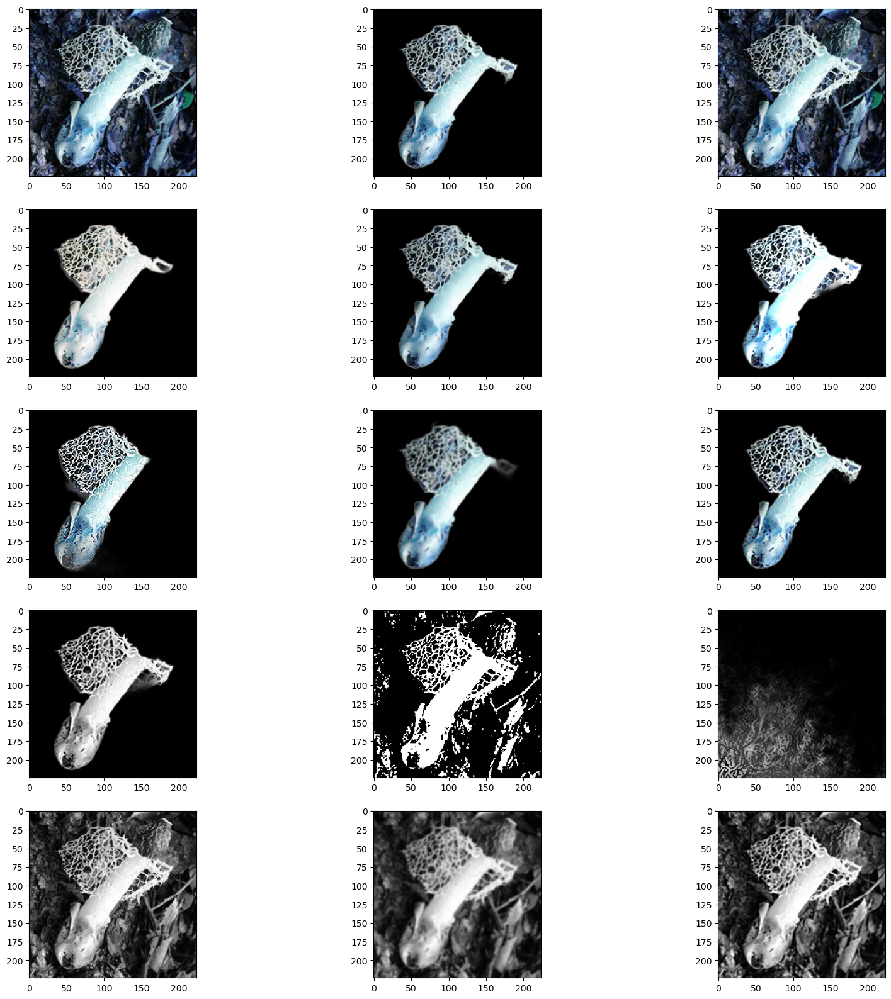

In [69]:
img_path = df_train[df_train['species']=='phallusindusiatuscomplex']['full_path'].iloc[20]

# img_path = df_train['full_path'][534]
image = cv2.imread(img_path)
normalized_image = image / 255.0

R, G, B = cv2.split(image)
output1_R = cv2.equalizeHist(R)
output1_G = cv2.equalizeHist(G)
output1_B = cv2.equalizeHist(B)

eq_img = cv2.merge((output1_R, output1_G, output1_B))

"""Gaussian Blur:
The Gaussian blur filter reduces detail and noise in an image. 
It “blurs” the image by applying a Gaussian function to each pixel and its surrounding pixels. 
This can help smooth edges and details in preparation for edge detection or other processing techniques."""
# imagem_blur = cv2.GaussianBlur(image, (15, 15), 0)


""" Median Blur:
The median blur filter is useful for removing salt and pepper noise from an image. 
It works by replacing each pixel with the median value of its neighboring pixels.
This can help smooth out isolated noisy pixels while preserving edges."""
# imagem_blur_median = cv2.medianBlur(image, 5)

"""The Laplacian filter is used to detect edges in an image. 
It works by detecting areas of rapid intensity change.
The output will be an image with edges highlighted, which can then be used for edge detection. 
This helps identify and extract features in an image.
"""
# # Aplicar o Laplacian Filter
# imagem_laplacian = cv2.Laplacian(image, cv2.CV_64F)
# # Converter a imagem para uint8
# imagem_laplacian = cv2.convertScaleAbs(imagem_laplacian)


"""Unsharp Masking:
Unsharp masking is a technique used to sharpen details and enhance edges in an image. 
It works by subtracting a blurred version of the image from the original image. 
This amplifies edges and details, making the image appear sharper. 
Unsharp masking can be used to sharpen details before feature extraction or object detection. """

# Aplicar o Gaussian Blur para criar a imagem suavizada (blurred)
imagem_blurred = cv2.GaussianBlur(image, (15, 15), 0.75)
# Criar a máscara não nítida (Unsharp Mask)
unsharp_mask = cv2.addWeighted(image, 1.5, imagem_blurred, -0.1, 0)


bilateral_filtered_image = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)

# Kernel para o filtro de nitidez
kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])

# Aplicar o filtro de nitidez
imagem_sharpen = cv2.filter2D(src=image, ddepth=-1, kernel=kernel)
imagem_sharpen_blured = cv2.filter2D(src=imagem_blurred, ddepth=-1, kernel=kernel)

gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
imagem_blurred_gray = cv2.GaussianBlur(gray_img, (15, 15), 1.0)
imagem_sharpen_blured_gray = cv2.filter2D(src=imagem_blurred_gray, ddepth=-1, kernel=kernel)

# Carregar a imagem em escala de cinza
gray = cv2.cvtColor(imagem_sharpen_blured, cv2.COLOR_BGR2GRAY)


# Aplicar limiarização global
_, thresholded = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

# Ou aplicar limiarização adaptativa
adaptive_thresholded = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                             cv2.THRESH_BINARY, 11, 2)

### Plot image with treatments 
fig, axs=plt.subplots(5,3, figsize=(20,20))

axs[0,0].imshow(image)
axs[0,1].imshow(remove_bg(image))
axs[0,2].imshow(normalized_image)
axs[1,0].imshow(remove_bg(eq_img))
axs[1,1].imshow(remove_bg(bilateral_filtered_image))
axs[1,2].imshow(remove_bg(unsharp_mask))
axs[2,0].imshow(remove_bg(imagem_sharpen))
axs[2,1].imshow(remove_bg(imagem_blurred))
axs[2,2].imshow(remove_bg(imagem_sharpen_blured))
axs[3,0].imshow(remove_bg(gray),cmap='gray')
axs[3,1].imshow(thresholded,cmap='gray')
axs[3,2].imshow(adaptive_thresholded,cmap='gray')
axs[4,0].imshow(gray_img,cmap='gray')
axs[4,1].imshow(imagem_blurred_gray,cmap='gray')
axs[4,2].imshow(imagem_sharpen_blured_gray,cmap='gray')

### Aplicando tratamentos

In [16]:
def apply_sharpen_blured_filter(image):
    imagem_blurred = cv2.GaussianBlur(image, (15, 15), 0.75)
    # Kernel para o filtro de nitidez
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])

    sharpen = cv2.filter2D(src=imagem_blurred, ddepth=-1, kernel=kernel)
    return sharpen

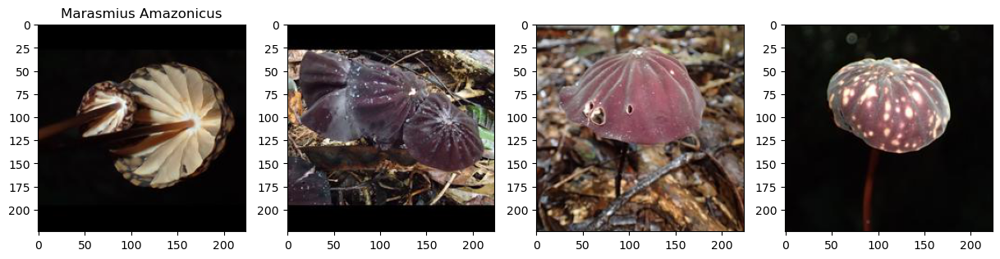

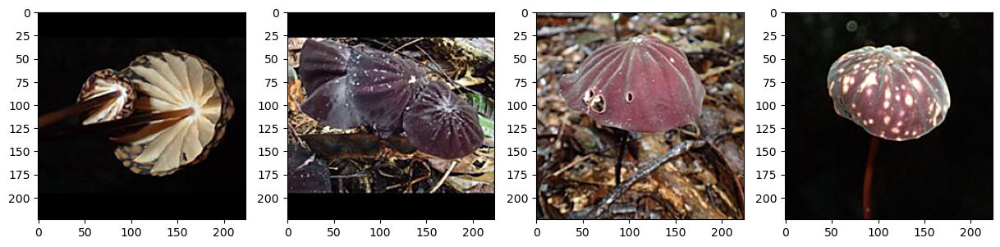

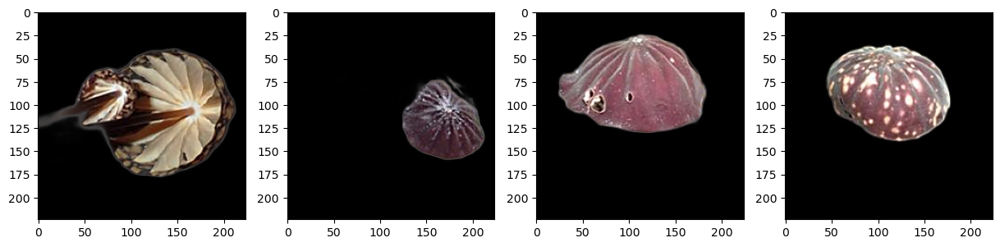

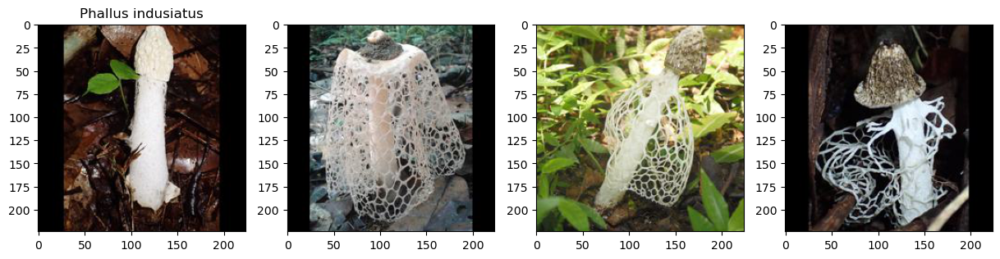

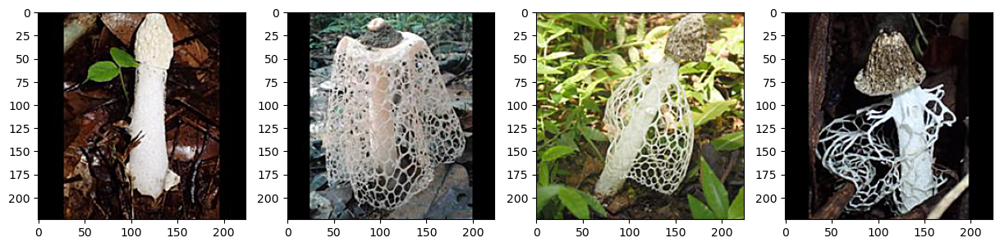

...

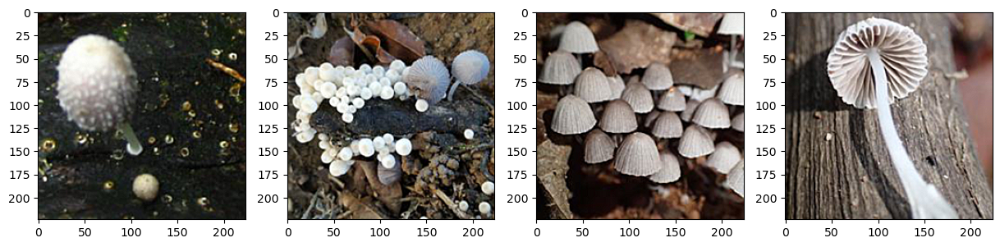

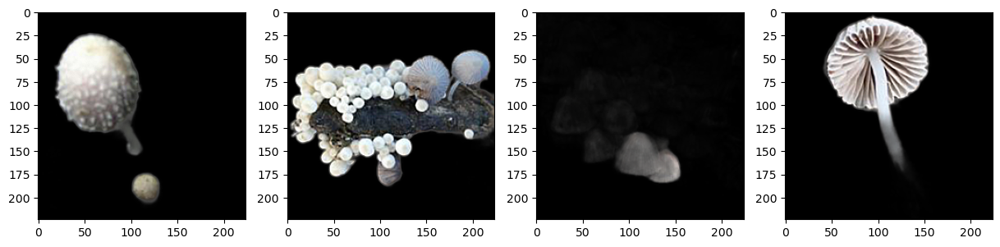

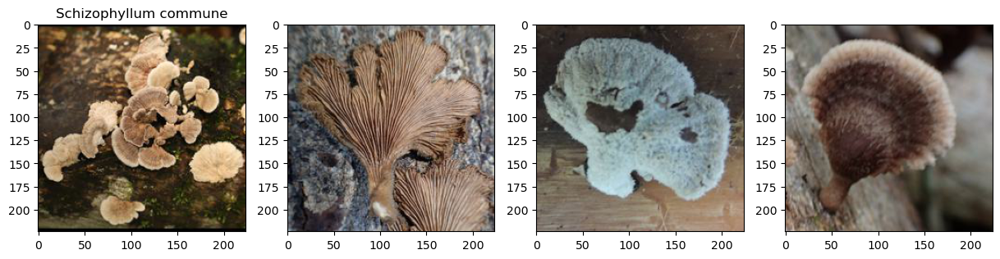

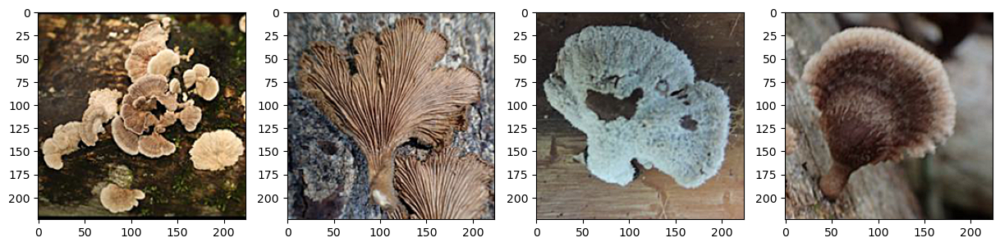

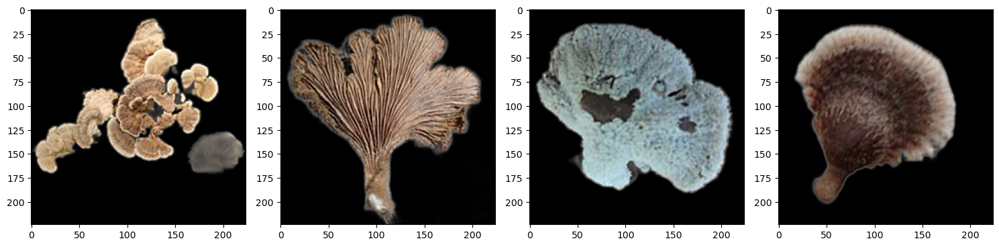

In [36]:
num_images_per_class = 4
imagem_list = []

for row_idx, (folder, file_paths) in enumerate(zip(df['folder'], df['file_paths'])):
    count = 0
    fig, axes = plt.subplots(nrows=1, ncols=num_images_per_class, figsize=(15, 10))
    fig_, axes_ = plt.subplots(nrows=1, ncols=num_images_per_class, figsize=(15, 10))
    fig__, axes__ = plt.subplots(nrows=1, ncols=num_images_per_class, figsize=(15, 10))

    axes[0].set_title(dict_names[folder])
    random.shuffle(file_paths)

    for col_idx, file_path in enumerate(file_paths):
        if count < num_images_per_class:
            img_path = os.path.join(diretorio_base, file_path)
            imagem = mpimg.imread(img_path)
            axes[col_idx].imshow(imagem)
            sharp_img = apply_sharpen_blured_filter(imagem)
            axes[col_idx].imshow(imagem)
            axes_[col_idx].imshow(sharp_img)
            axes__[col_idx].imshow(remove_bg(sharp_img))
            count += 1


# Set the class label as the title for the first image in the row
plt.tight_layout()
plt.show()

In [27]:
# Criar uma nova pasta para salvar as imagens tratadas
output_dir = "imagens_tratadas"
os.makedirs(os.path.join(train_folder, output_dir), exist_ok=True)

output_dir = os.path.join(train_folder, output_dir)
# Lista para armazenar os novos caminhos das imagens tratadas
new_paths = []

# Iterar sobre as imagens no DataFrame
for image_path, folder in zip(df_train['full_path'], df_train['folder']):
    
    image = cv2.imread(image_path)
    
    
    if image is not None:
        # Aplicar o filtro de tratamento na imagem
        # processed_image = apply_sharpen_blured_filter(image)
        # processed_image_bg = remove_bg(processed_image)
        # Definir o novo caminho para salvar a imagem tratada
        new_image_name = f"processed_{os.path.basename(image_path)}"
        new_image_path = os.path.join(output_dir, folder, new_image_name)
        
        # os.makedirs(os.path.join(output_dir, folder), exist_ok=True)
        # Salvar a imagem tratada
        # cv2.imwrite(os.path.join(output_dir, folder, new_image_path), processed_image_bg)
        # Adicionar o novo caminho à lista
        new_paths.append(os.path.join(output_dir, folder, new_image_path))
    else:
        print(f"Imagem não encontrada: {image_path}")

# Adicionar a nova coluna ao DataFrame
df_train['full_path_tratamentos'] = new_paths

Vou remover na mao algumas imagens